# Recognition pipeline

In [1]:
import PIL.Image
import numpy as np
from typing import Union
from glob import glob
import pandas as pd
import os
from treys import Card
from termcolor import colored
from utils import eval_listof_games , debug_listof_games, save_results , load_results
import cv2
import matplotlib.pyplot as plt

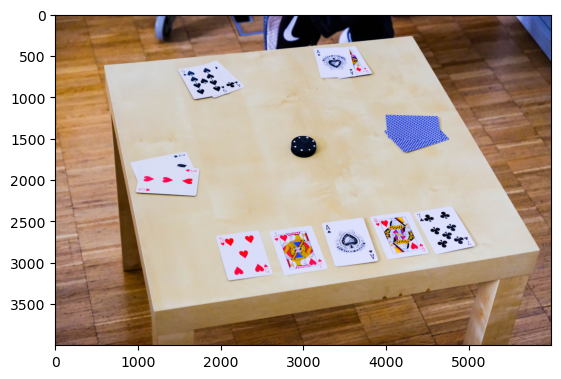

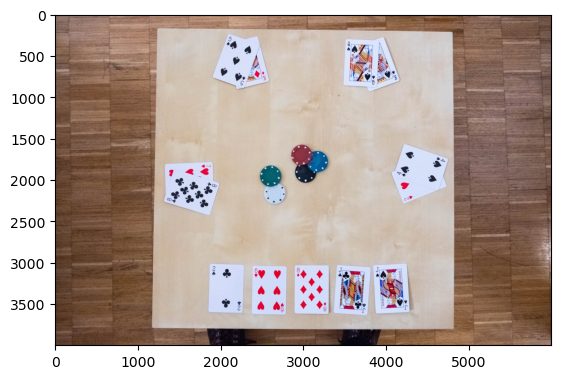

In [2]:
path_data = "data/train"
path_setup = "data/image_setup/"

file = os.path.join(path_data, f"train_{str(0).zfill(2)}.jpg")
file_xtrem = os.path.join(path_setup, "ultimate_test.jpg")

# open the image
im_xtrem = PIL.Image.open(file_xtrem)
plt.imshow(im_xtrem)
plt.show()

# open the image
im = PIL.Image.open(file)
plt.imshow(im)
plt.show()

In [3]:
from recognition_functions import table_extraction

In [4]:
problematic_imgs = {5, 6, 8, 11, 12, 13, 22}

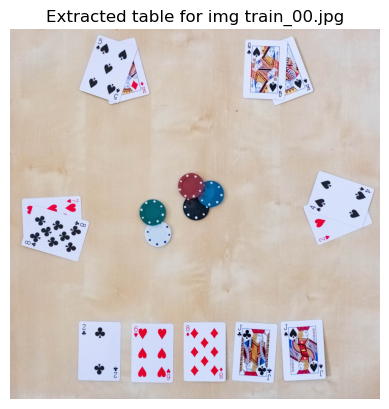

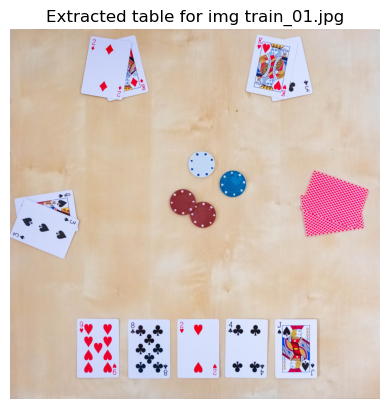

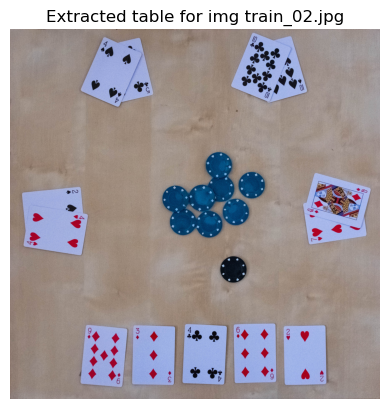

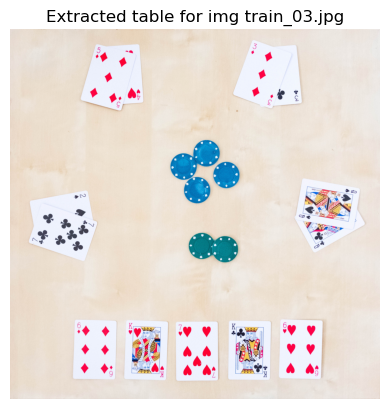

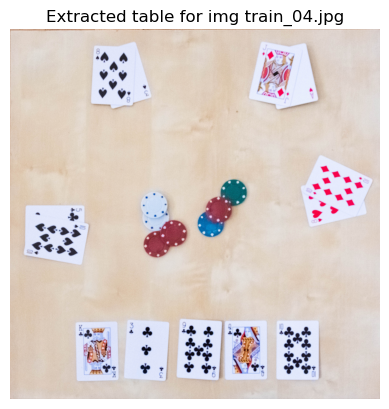

...

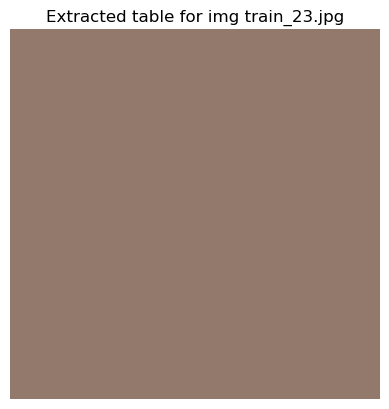

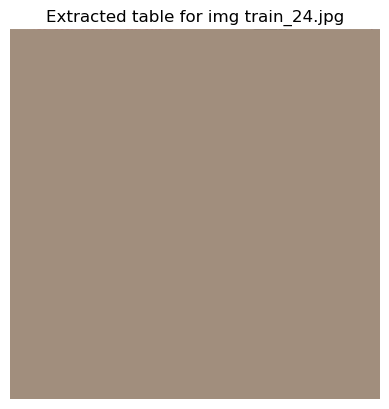

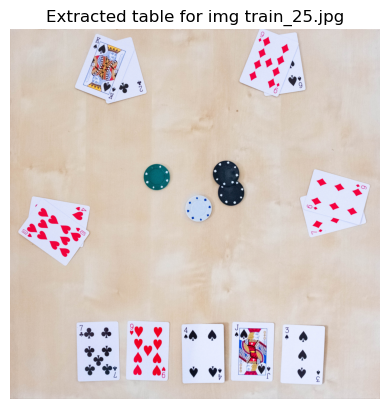

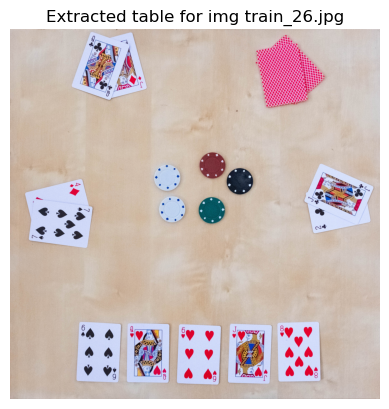

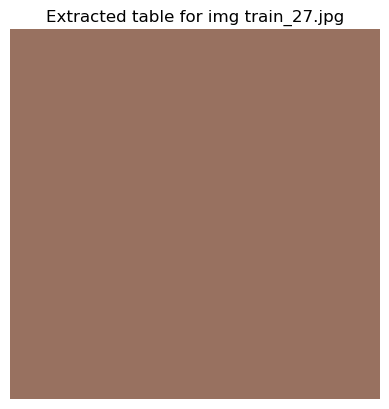

In [5]:
for i in range(28):
    #if i not in problematic_imgs:
    file = os.path.join(path_data, f"train_{str(i).zfill(2)}.jpg")
    im = PIL.Image.open(file)
    plt.title(f"Extracted table for img train_{str(i).zfill(2)}.jpg")
    plt.imshow(table_extraction(img = np.array(im)))
    plt.axis(False)
    plt.show()

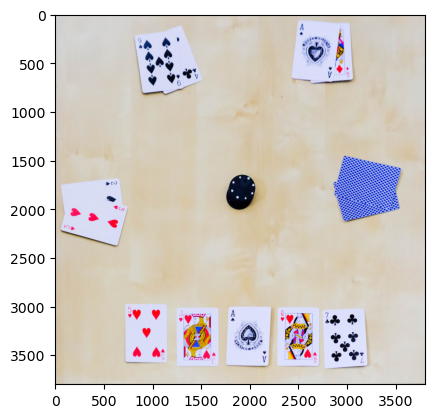

In [6]:
plt.imshow(table_extraction(img = np.array(im_xtrem)))
plt.show()

## Intermediate steps

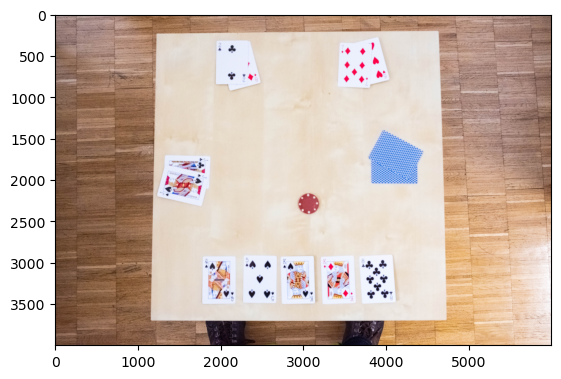

In [15]:
path_data = "data/train"

file = os.path.join(path_data, f"train_{str(6).zfill(2)}.jpg")

# open the image
im = PIL.Image.open(file)
plt.imshow(im)
plt.show()

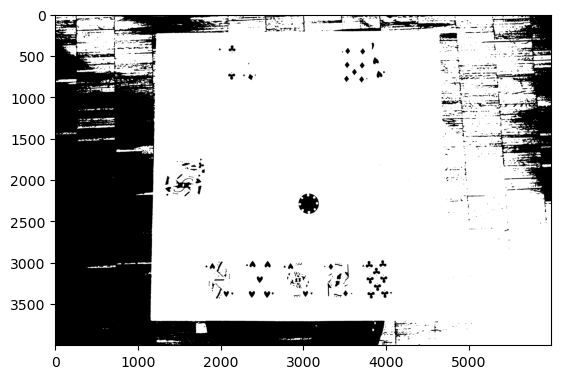

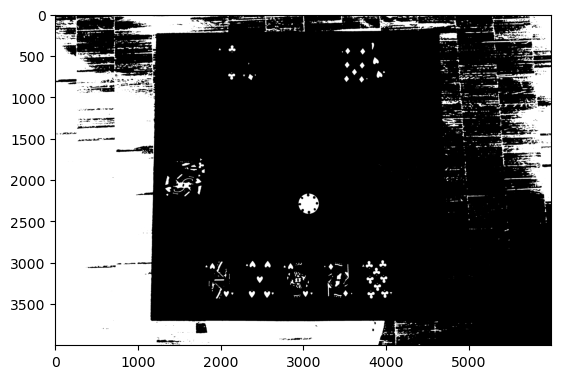

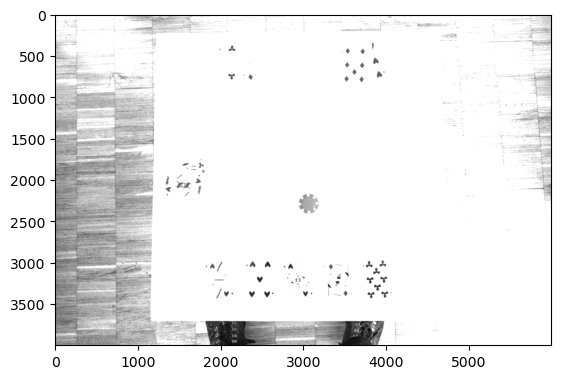

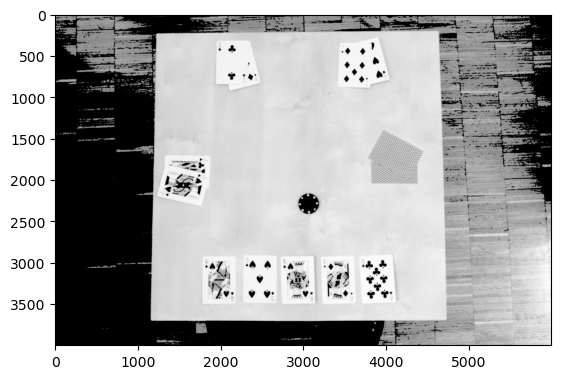

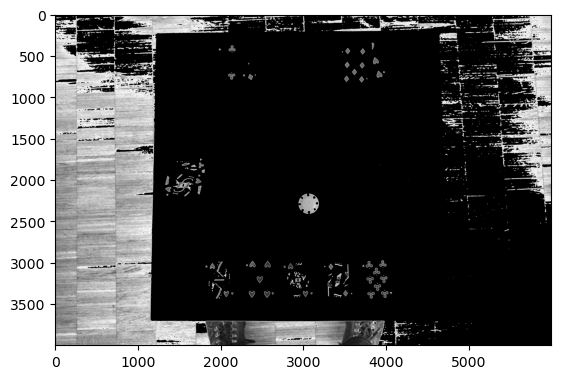

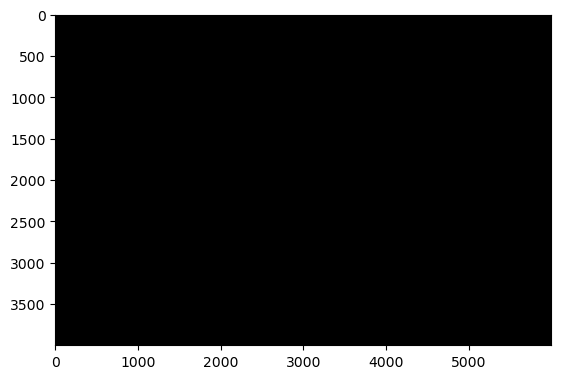

In [29]:
img = np.array(im)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(11,11),1000) 

ret,thresh1 = cv2.threshold(blur,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(blur,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(blur,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(blur,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(blur,127,255,cv2.THRESH_TOZERO_INV)
ret,thresh6 = cv2.threshold(blur,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY)
#ret,thresh7 = cv2.threshold(blur,255,cv2.THRESH_TOZERO_INV)

plt.imshow(thresh1,  cmap='gray')
plt.show()
plt.imshow(thresh2,  cmap='gray')
plt.show()
plt.imshow(thresh3,  cmap='gray')
plt.show()
plt.imshow(thresh4,  cmap='gray')
plt.show()
plt.imshow(thresh5,  cmap='gray')
plt.show()
plt.imshow(thresh6,  cmap='gray')
plt.show()

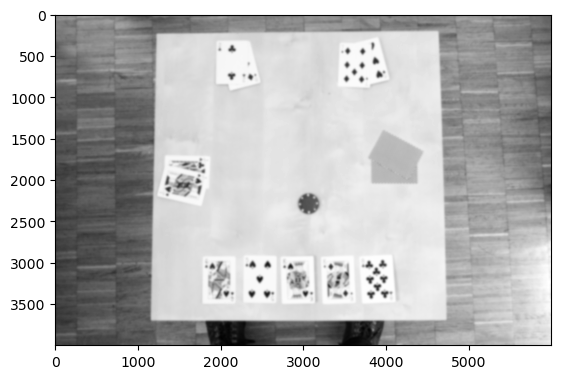

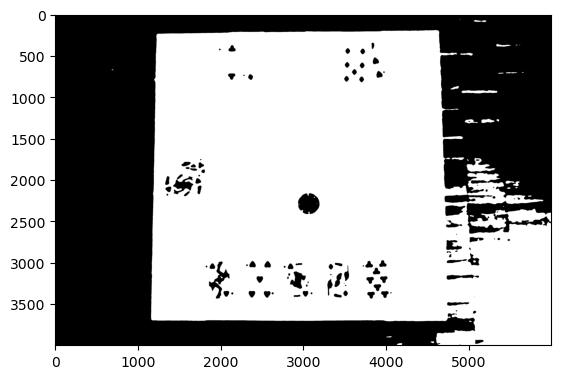

In [33]:
img = np.array(im)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(101,101),10) 
#blur = cv2.GaussianBlur(gray,(5,5),0)

plt.imshow(blur,  cmap='gray')
plt.show()
flag, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)

plt.imshow(thresh,  cmap='gray')
plt.show()

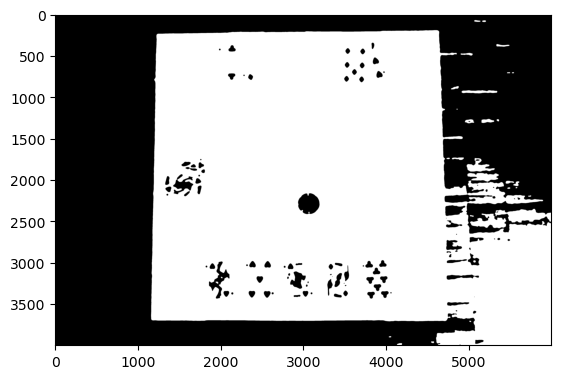

In [34]:
opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel= np.ones((11,11), np.uint8))
plt.imshow(opened,  cmap='gray')
plt.show()

In [78]:
import math 


def line_pipeline(img):
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(101,101),10) 
    #blur = cv2.GaussianBlur(gray,(5,5),0)
    flag, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_OTSU)


    opened = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel= np.ones((11,11), np.uint8))

    dst = cv2.Canny(opened, 50, 200, None, 3)

    cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
    cdstP = np.copy(cdst)

    lines = cv2.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)
    
    if lines is not None:
        for i in range(0, len(lines)):
            rho = lines[i][0][0]
            theta = lines[i][0][1]
            a = math.cos(theta)
            b = math.sin(theta)
            x0 = a * rho
            y0 = b * rho
            pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
            pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
            drawLine(cdst, pt1, pt2)
            #cv2.line(cdst, pt1, pt2, (0,0,255), 5, cv2.LINE_AA)
    return cdst
    #plt.imshow(cdst)
    #plt.show()

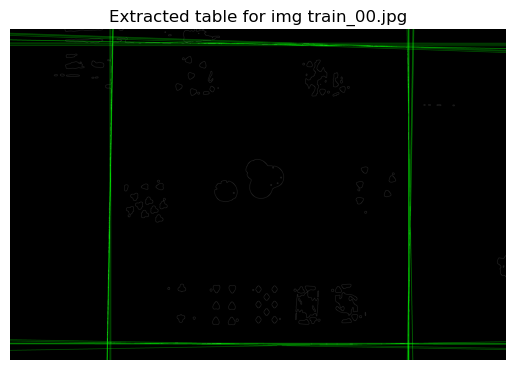

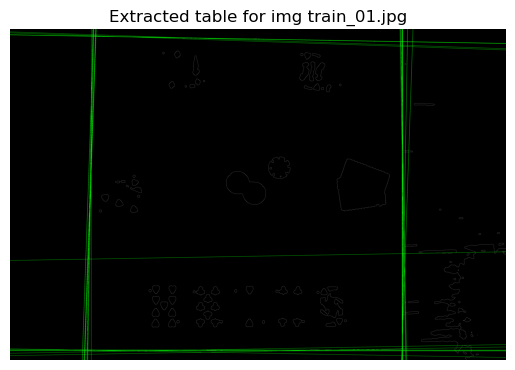

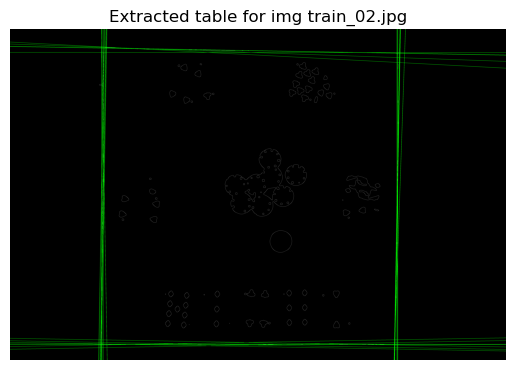

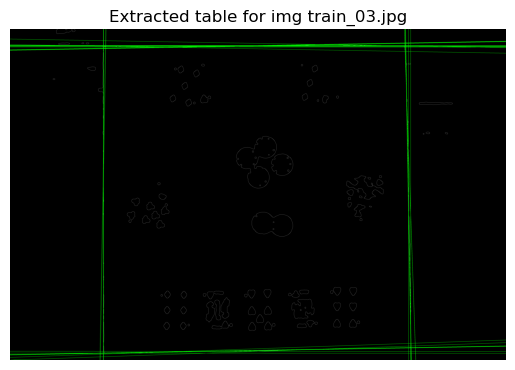

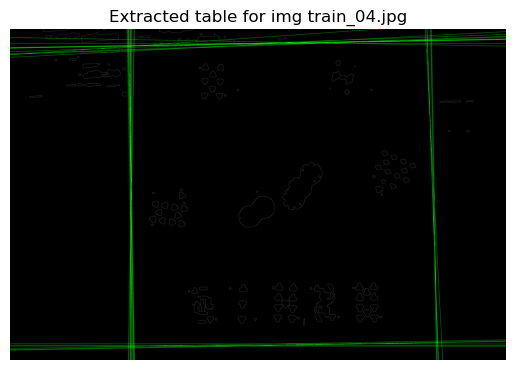

...

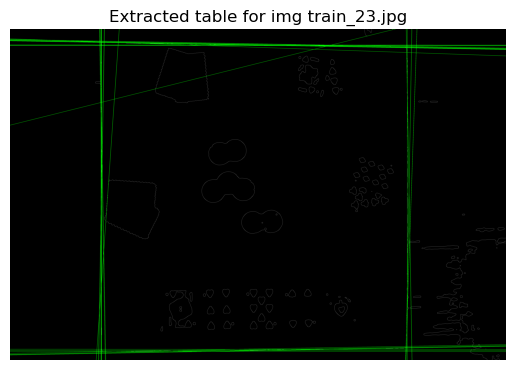

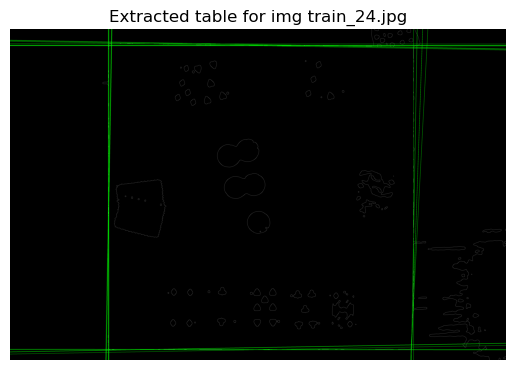

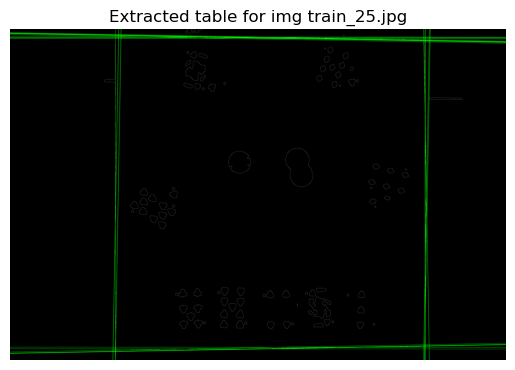

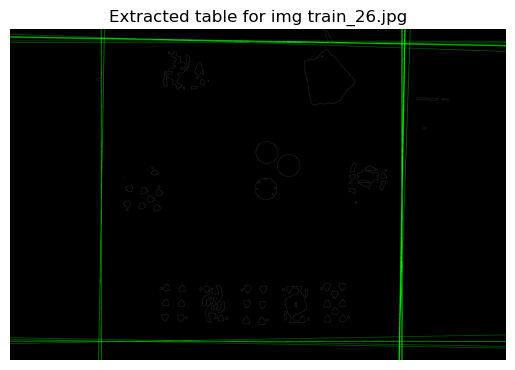

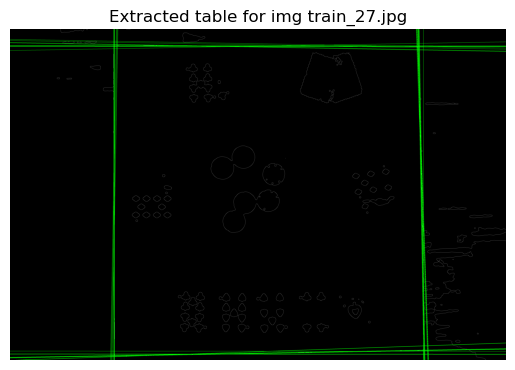

In [79]:
for i in range(28):
    #if i not in problematic_imgs:
    file = os.path.join(path_data, f"train_{str(i).zfill(2)}.jpg")
    im = PIL.Image.open(file)
    plt.title(f"Extracted table for img train_{str(i).zfill(2)}.jpg")
    plt.imshow(line_pipeline(img = np.array(im)))
    plt.axis(False)
    plt.show()

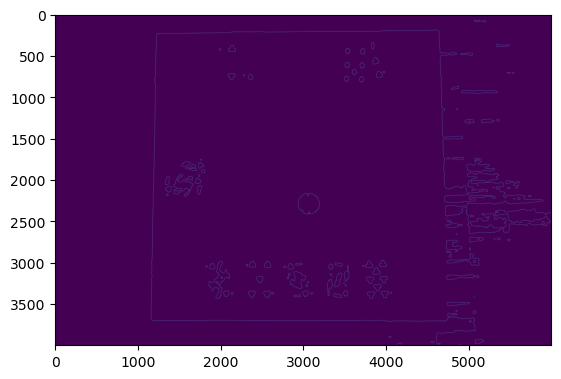

In [70]:
import math 

dst = cv2.Canny(opened, 50, 200, None, 3)

plt.imshow(dst)
plt.show()
    
# Copy edges to the images that will display the results in BGR
cdst = cv2.cvtColor(dst, cv2.COLOR_GRAY2BGR)
cdstP = np.copy(cdst)

lines = cv2.HoughLines(dst, 1, np.pi / 180 , 200, None, 0, 0)

In [73]:
### function to find slope 
def slope(p1,p2):
    x1,y1=p1
    x2,y2=p2
    if x2!=x1:
        return((y2-y1)/(x2-x1))
    else:
        return 'NA'

### main function to draw lines between two points
def drawLine(image,p1,p2):
    x1,y1=p1
    x2,y2=p2
    ### finding slope
    m=slope(p1,p2)
    ### getting image shape
    h,w=image.shape[:2]

    if m!='NA':
        ### here we are essentially extending the line to x=0 and x=width
        ### and calculating the y associated with it
        ##starting point
        px=0
        py=-(x1-0)*m+y1
        ##ending point
        qx=w
        qy=-(x2-w)*m+y2
    else:
    ### if slope is zero, draw a line with x=x1 and y=0 and y=height
        px,py=x1,0
        qx,qy=x1,h
    
    #print(m)
    cv2.line(image, (int(px), int(py)), (int(qx), int(qy)), (0, 255, 0), 2)
    return image


((1207, 1021), (1242, -978))
((-1000, 3703), (999, 3704))
((-1000, 3700), (999, 3701))
((1212, 1021), (1247, -978))
((4598, -1161), (4668, 837))
((-1000, 3706), (999, 3707))
((-995, 292), (1004, 257))
((-995, 277), (1004, 242))
((-1000, 210), (999, 211))
((-1000, 214), (999, 215))
((-1000, 3708), (999, 3709))
((-1063, 3642), (935, 3677))
((-995, 281), (1004, 246))
((-934, 3777), (1065, 3742))
((-933, 3804), (1065, 3769))


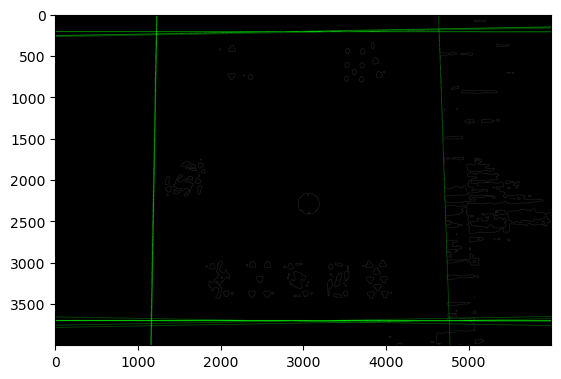

In [77]:
if lines is not None:
    lines_pts = []
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        slope = slope(pt1, pt2)
        lines_pts.append((pt1, pt2, slope))
        drawLine(cdst, pt1, pt2)
        #cv2.line(cdst, pt1, pt2, (0,0,255), 5, cv2.LINE_AA)
      
    intersection_pts = []
    for pt1_a, pt2_a, slope_a in lines_pts:
        for pt1_b, pt2_b, slope_b in lines_pts:
            if(abs(slope_a - slope_b) > 10):
                line_intersection()
        print(pt1_a, pt2_a)
        
plt.imshow(cdst)
plt.show()

In [ ]:
def line_intersection(line1, line2):
    xdiff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    ydiff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    if div == 0:
        raise Exception('lines do not intersect')

    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    return x, y

print line_intersection((A, B), (C, D))

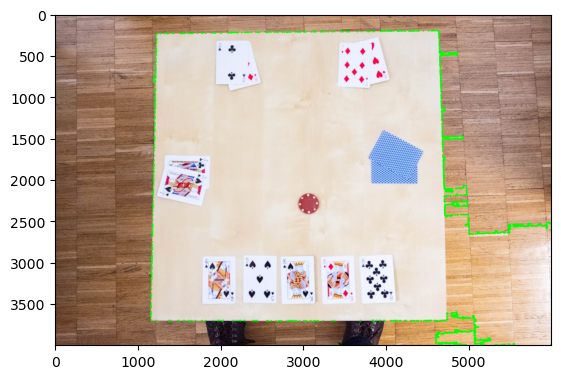

In [18]:
contours, hierarchy = cv2.findContours(opened,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=cv2.contourArea,reverse=True) 

cv2.drawContours(img, contours[0], -1,(0,255,0),20)
plt.imshow(img)
plt.show()

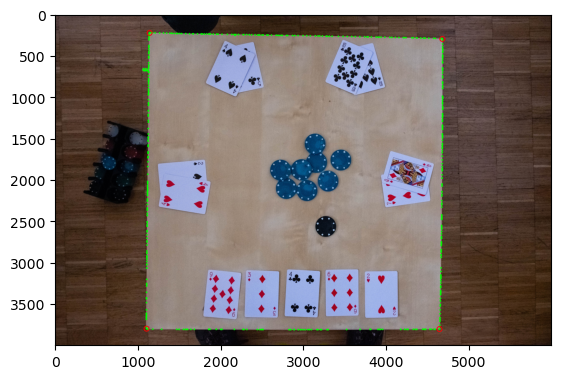

[[1144.  228.]
 [4685.  301.]
 [4651. 3807.]
 [1107. 3802.]]


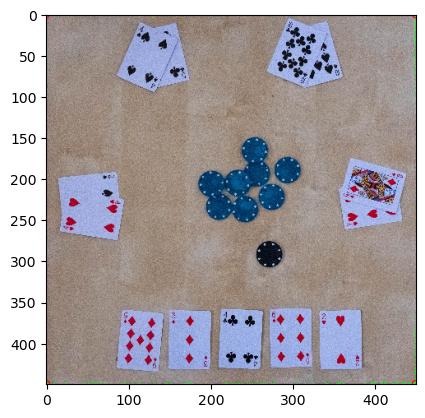

In [12]:
def rectify(h):
    h = h.reshape((4,2))
    hnew = np.zeros((4,2),dtype = np.float32)

    add = h.sum(1)
    hnew[0] = h[np.argmin(add)]
    hnew[2] = h[np.argmax(add)]

    diff = np.diff(h,axis = 1)
    hnew[1] = h[np.argmin(diff)]
    hnew[3] = h[np.argmax(diff)]

    return hnew

table_cont = contours[0]
peri = cv2.arcLength(table_cont,True)
approx = np.array((cv2.approxPolyDP(table_cont,0.02*peri,True)))[:,0]

for a in approx:
    cv2.circle(img, (a[0], a[1]), 30,(255, 0, 0), 10)
plt.imshow(img)
plt.show()

diff = np.abs(approx[:,0]-approx[:,1])
approx = rectify(approx[np.argsort(diff)[::-1][:4]])


print(approx)

h = np.array([ [0,0],[449,0],[449,449],[0,449] ],np.float32)
transform = cv2.getPerspectiveTransform(approx, h)
warp = cv2.warpPerspective(img,transform,(450,450))

plt.imshow(warp)
plt.show()

#rect = cv2.minAreaRect(contours[2])
#r = cv2.cv.BoxPoints(rect)

[1067  225 3625 3591]
[[1058.7594  3809.9146 ]
 [1068.151    224.75168]
 [4692.3784   234.24536]
 [4682.987   3819.4082 ]]


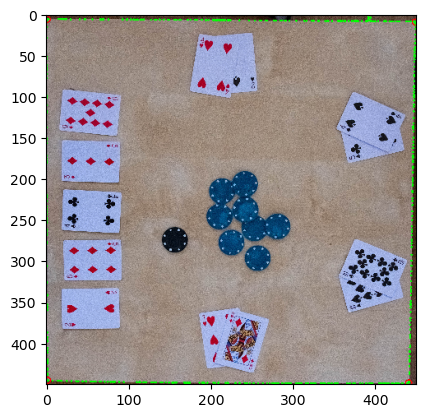

In [13]:
rot_rect = cv2.minAreaRect(contours[0])
box = np.array(cv2.boundingRect(contours[0]))
print(box)
box = cv2.boxPoints(rot_rect)
print(box)

h = np.array([ [0,0],[449,0],[449,449],[0,449] ],np.float32)
transform = cv2.getPerspectiveTransform(box, h)
warp = cv2.warpPerspective(img,transform,(450,450))

plt.imshow(warp)
plt.show()

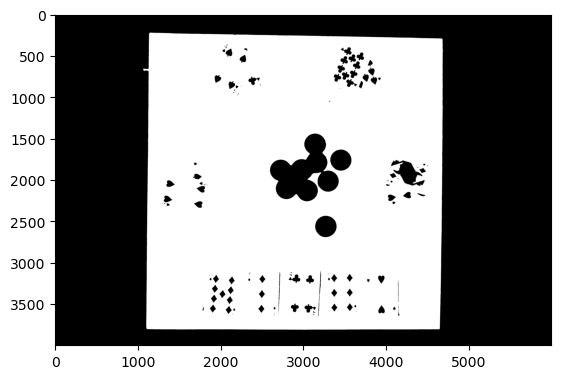

(4000, 6000)


In [14]:
totalLabels, label_ids, values, centroid = cv2.connectedComponentsWithStats(opened)

for i in range(1, totalLabels):
    area = values[i, cv2.CC_STAT_AREA] 
 
    if (area > 5000000):
       
        # Labels stores all the IDs of the components on the each pixel
        # It has the same dimension as the threshold
        # So we'll check the component
        # then convert it to 255 value to mark it white
        componentMask = (label_ids == i).astype("uint8") * 255
         
        plt.imshow(componentMask,  cmap='gray')
        plt.show()
        print(componentMask.shape)
        # Creating the Final output mask